In [1]:
import sys
sys.path.append("/workdir/unsupervised_pretrain/")

In [2]:
import torch
from tqdm.notebook import tqdm
import numpy as np
from models import SeriesResNet18, Hat
from datasets import SeriesEmbedDataset

# Get ready to do some business #

In [3]:
ds = SeriesEmbedDataset(["/datasets/datasets/unsupervised-sentinel2/testset-16SEF/"], size=512, series_length=20)

In [4]:
device = torch.device("cuda")

In [5]:
model = torch.load("/workdir/unsupervised_pretrain/resnet18-512.pth", map_location=device).to(device)

In [6]:
hat = torch.load("/workdir/unsupervised_pretrain/resnet18hat-512.pth", map_location=device).to(device)

# Load the test set, compute embeddings, save embeddings #

This only needs to be done once.

In [ ]:
embeddings_visual = []
embeddings_text = []
with torch.inference_mode():
    for i in tqdm(range(0, len(ds), 2)):
        imagery, _, _, _ = ds[i]
        imagery = torch.unsqueeze(imagery.to(device), dim=0)
        embedding_visual = model(imagery)
        embedding_text = hat(embedding_visual)
        embedding_visual = embedding_visual.detach().cpu()
        embedding_text = embedding_text.detach().cpu()
        embeddings_visual.append(embedding_visual)
        embeddings_text.append(embedding_text)

In [ ]:
embeddings_visual[0].shape

In [ ]:
embeddings_visual_numpy = torch.cat(embeddings_visual, dim=0).numpy()

In [ ]:
embeddings_text_numpy = torch.cat(embeddings_text, dim=0).numpy()

In [ ]:
np.save("/workdir/unsupervised_pretrain/jupyter/embeddings-visual.npy", embeddings_visual_numpy)

In [ ]:
np.save("/workdir/unsupervised_pretrain/jupyter/embeddings-text.npy", embeddings_text_numpy)

# Load embeddings #

In [7]:
embeddings_visual_numpy = np.load("/workdir/unsupervised_pretrain/jupyter/embeddings-visual.npy")
embeddings_visual_numpy /= np.linalg.norm(embeddings_visual_numpy, axis=1, keepdims=True)

In [8]:
embeddings_text_numpy = np.load("/workdir/unsupervised_pretrain/jupyter/embeddings-text.npy")
embeddings_text_numpy /= np.linalg.norm(embeddings_text_numpy, axis=1, keepdims=True)

In [9]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [10]:
tsne = TSNE(n_components=2, random_state=0)

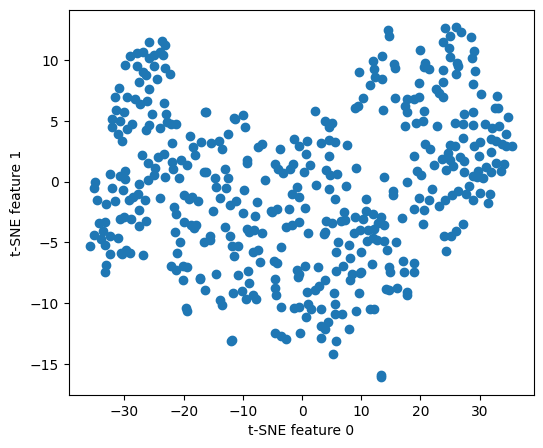

In [11]:
data_2d = tsne.fit_transform(embeddings_visual_numpy)

# plot the result
plt.figure(figsize=(6, 5))
plt.scatter(data_2d[:, 0], data_2d[:, 1])
plt.xlabel("t-SNE feature 0")
plt.ylabel("t-SNE feature 1")
plt.show()

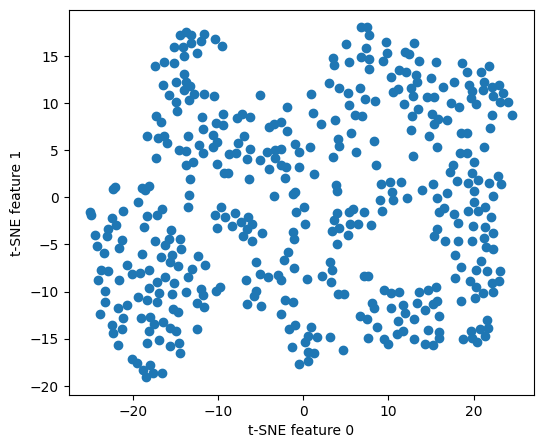

In [12]:
data_2d = tsne.fit_transform(embeddings_text_numpy)

# plot the result
plt.figure(figsize=(6, 5))
plt.scatter(data_2d[:, 0], data_2d[:, 1])
plt.xlabel("t-SNE feature 0")
plt.ylabel("t-SNE feature 1")
plt.show()

In [13]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [14]:
tsne3 = TSNE(n_components=3, random_state=0)

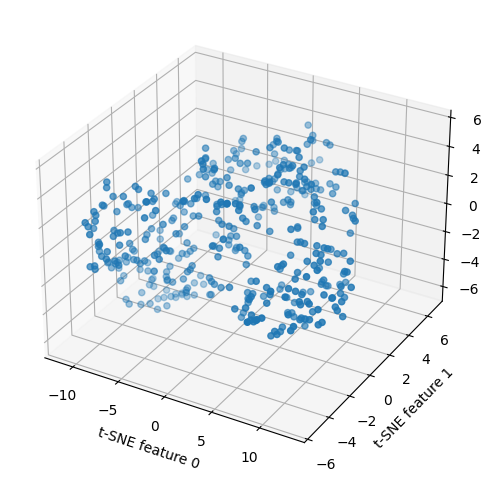

In [15]:
data_3d = tsne3.fit_transform(embeddings_visual_numpy)

# create a 3D plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# plot the result
scatter = ax.scatter(data_3d[:, 0], data_3d[:, 1], data_3d[:, 2])
ax.set_xlabel('t-SNE feature 0')
ax.set_ylabel('t-SNE feature 1')
ax.set_zlabel('t-SNE feature 2')
plt.show()

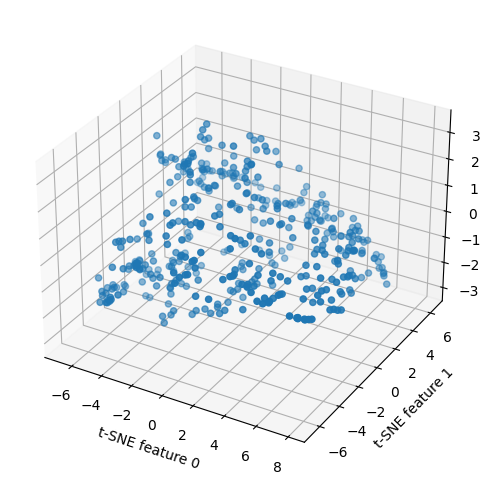

In [16]:
data_3d = tsne3.fit_transform(embeddings_text_numpy)

# create a 3D plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

# plot the result
scatter = ax.scatter(data_3d[:, 0], data_3d[:, 1], data_3d[:, 2])
ax.set_xlabel('t-SNE feature 0')
ax.set_ylabel('t-SNE feature 1')
ax.set_zlabel('t-SNE feature 2')
plt.show()

# Look for similarity #

In [17]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cdist
from scipy import spatial
import numpy as np
import matplotlib.pyplot as plt

## Utility functions ##

In [18]:
def top_k_query_cosine(query_vector, data, k):
    # calculate cosine similarities
    cosine_similarities = cosine_similarity(data, query_vector.reshape(1, -1)).flatten()

    # get top-k indices
    top_k_indices = np.argpartition(-cosine_similarities, k)[:k]
    
    # return indices of the top-k closest vectors
    return top_k_indices

In [19]:
def top_k_query_l1(query_vector, data, k):
    # calculate L1 distances
    l1_distances = cdist(data, query_vector.reshape(1, -1), 'cityblock').flatten()

    # get top-k indices
    top_k_indices = np.argpartition(l1_distances, k)[:k]
    
    # return indices of the top-k closest vectors
    return top_k_indices

In [20]:
def top_k_query_l2(query_vector, data, k):
    # calculate L2 distances
    l1_distances = cdist(data, query_vector.reshape(1, -1), 'euclidean').flatten()

    # get top-k indices
    top_k_indices = np.argpartition(l1_distances, k)[:k]
    
    # return indices of the top-k closest vectors
    return top_k_indices

In [21]:
def display_image(images, image_number):
    # Check that image_number is valid
    if image_number < 0 or image_number >= images.shape[0]:
        raise ValueError('image_number must be between 0 and the number of images')

    # Get the RGB bands (adjusting for 1-based indexing)
    r = images[image_number, 3, :, :] # Red band
    g = images[image_number, 2, :, :] # Green band
    b = images[image_number, 1, :, :] # Blue band

    # Stack them along the last dimension to create an RGB image
    rgb = np.stack([r, g, b], axis=-1)

    # Clamp and scale to [0, 255] range for display
    rgb = np.clip(rgb, 0, 2500)  # Ensure values are within 0-2500
    rgb = (rgb / 2500) * 255  # Scale values to 0-255

    # Convert to 8-bit unsigned integer type
    rgb = rgb.astype(np.uint8)

    # Show the image
    plt.figure(figsize=(6, 6))
    plt.imshow(rgb)
    plt.axis('off')  # Hide the axes
    plt.show()

In [22]:
def display_all_images(images):
    # Determine the grid size to accommodate all images
    grid_size = int(np.ceil(np.sqrt(images.shape[0])))

    fig, ax = plt.subplots(grid_size, grid_size, figsize=(12, 12))

    for i in range(grid_size * grid_size):
        if i < images.shape[0]:
            # Get the RGB bands (adjusting for 1-based indexing)
            r = images[i, 3, :, :]  # Red band
            g = images[i, 2, :, :]  # Green band
            b = images[i, 1, :, :]  # Blue band

            # Stack them along the last dimension to create an RGB image
            rgb = np.stack([r, g, b], axis=-1)

            # Clamp and scale to [0, 255] range for display
            rgb = np.clip(rgb, 0, 2500)  # Ensure values are within 0-2500
            rgb = (rgb / 2500) * 255  # Scale values to 0-255

            # Convert to 8-bit unsigned integer type
            rgb = rgb.astype(np.uint8)

            # Display the image
            ax[i // grid_size, i % grid_size].imshow(rgb)
            ax[i // grid_size, i % grid_size].axis('off')  # Hide the axes
        else:
            # Hide empty subplots
            ax[i // grid_size, i % grid_size].axis('off')

    plt.show()

## Visual-visual queries ##

In [23]:
query_vector = embeddings_visual_numpy[333]
print(top_k_query_cosine(query_vector, embeddings_visual_numpy, 5))
print(top_k_query_l1(query_vector, embeddings_visual_numpy, 5))
print(top_k_query_l2(query_vector, embeddings_visual_numpy, 5))

[293 354 333 263 313]
[333 354 293 313 263]
[293 354 333 263 313]


In [24]:
images_this, _, _, _ = ds[333]
images_this = images_this.detach().cpu().numpy()

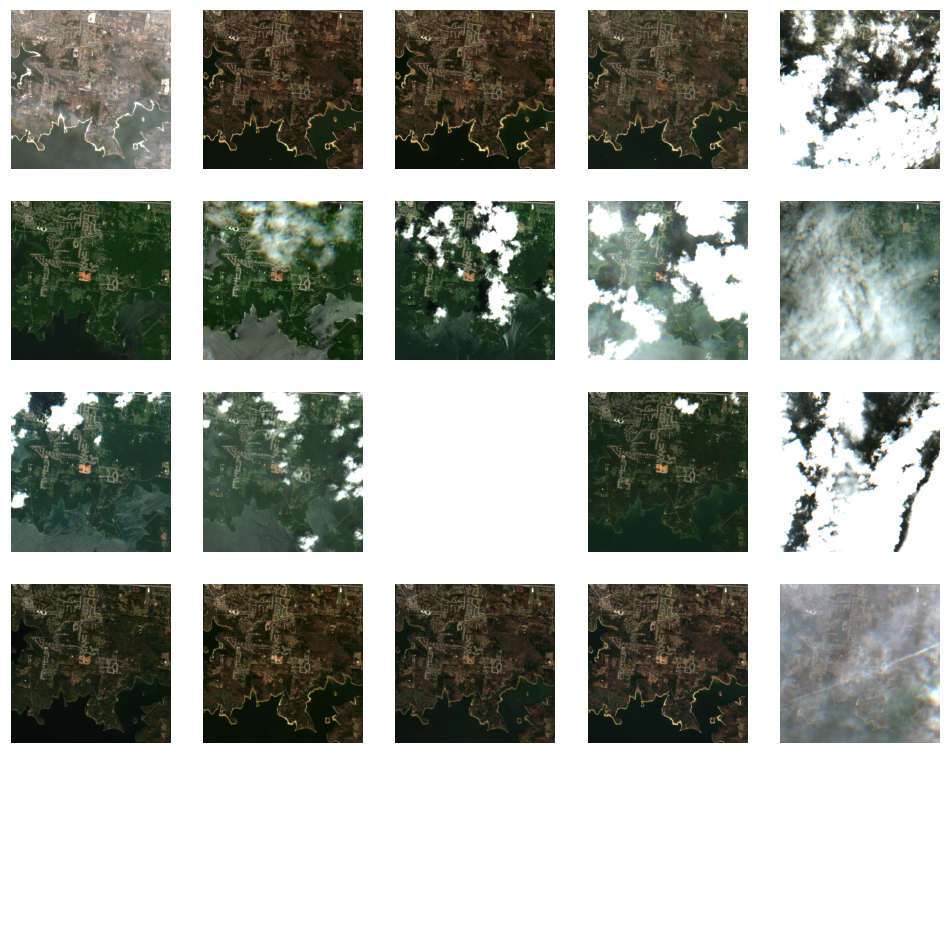

In [25]:
display_all_images(images_this)

In [26]:
images_neighbor, _, _, _ = ds[293]
images_neighbor = images_neighbor.detach().cpu().numpy()

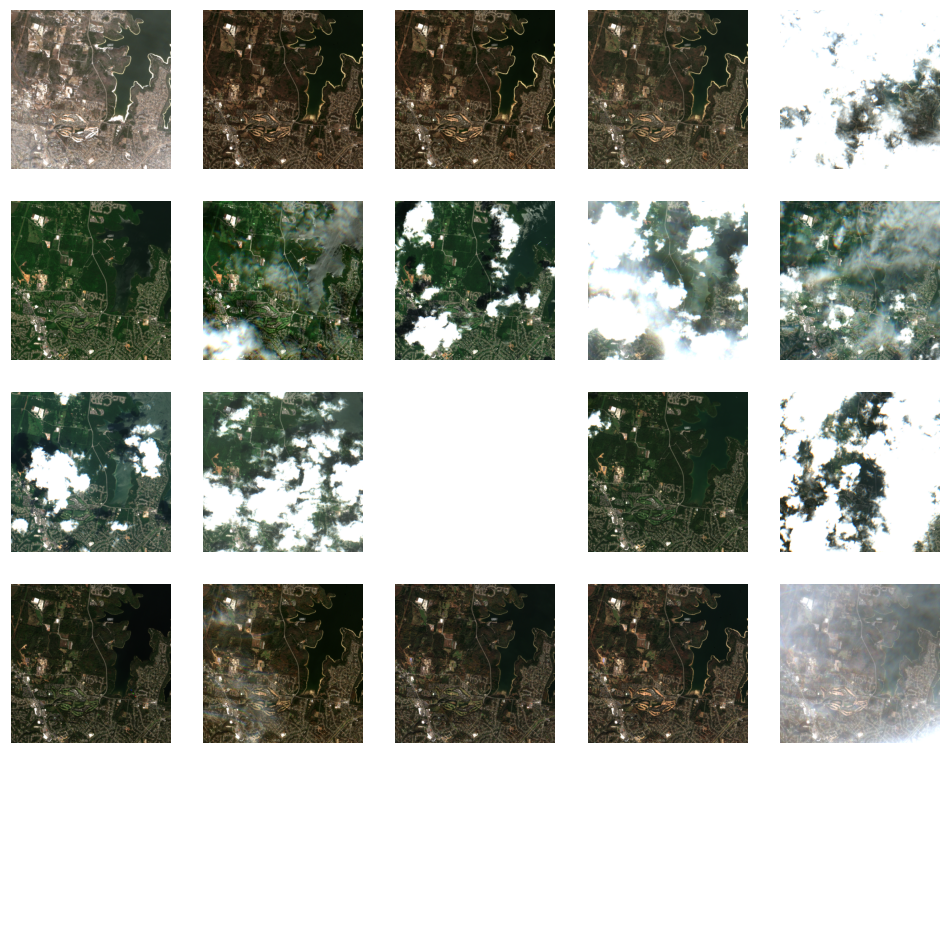

In [27]:
display_all_images(images_neighbor)

## Derived-text, derived-text queries ##

In [28]:
query_vector = embeddings_text_numpy[333]
print(top_k_query_cosine(query_vector, embeddings_text_numpy, 5))
print(top_k_query_l1(query_vector, embeddings_text_numpy, 5))
print(top_k_query_l2(query_vector, embeddings_text_numpy, 5))

[333 354 241 278 334]
[333 354 241 278 334]
[333 354 241 278 334]


In [29]:
images_neighbor, _, _, _ = ds[354]
images_neighbor = images_neighbor.detach().cpu().numpy()

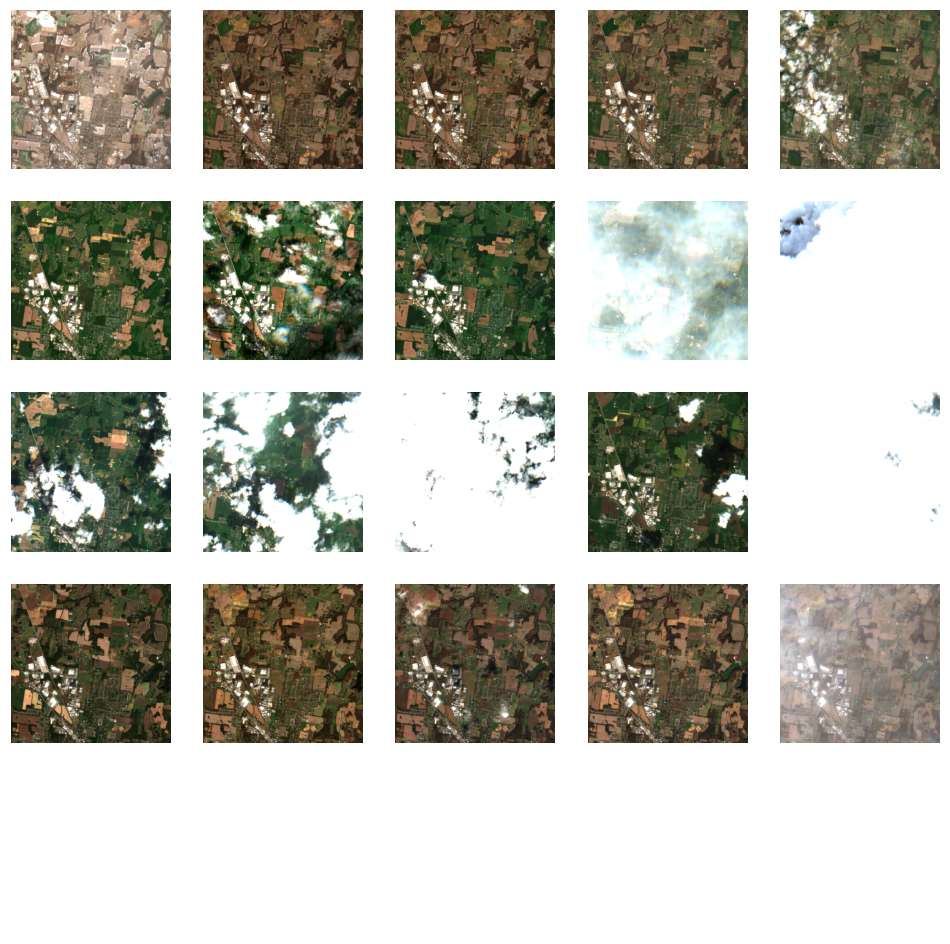

In [30]:
display_all_images(images_neighbor)

## Neighborhood similarity ##

In [31]:
def neighborhood_similarity(embeddings1, embeddings2, fn, k):
    intersections = []
    for embedding1, embedding2 in zip(embeddings1, embeddings2):
        neighborhood1 = set(fn(embedding1, embeddings1, k))
        neighborhood2 = set(fn(embedding2, embeddings2, k))
        intersections.append(len(neighborhood1 & neighborhood2))
    return (np.mean(intersections) - 1) / (k - 1)

In [32]:
neighborhood_similarity(embeddings_visual_numpy, embeddings_text_numpy, top_k_query_cosine, 4)

0.20861678004535147

In [33]:
cosine_overlap = []
l1_overlap = []
for i in tqdm(range(2, 32)):
    # Don't Hassle Me I'm Local
    cosine_overlap.append(neighborhood_similarity(embeddings_visual_numpy, embeddings_text_numpy, top_k_query_cosine, i))
    l1_overlap.append(neighborhood_similarity(embeddings_visual_numpy, embeddings_text_numpy, top_k_query_l1, i))

  0%|          | 0/30 [00:00<?, ?it/s]

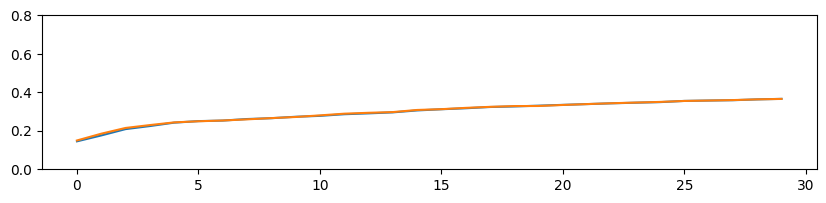

In [34]:
plt.figure(figsize=(10, 2))
plt.plot(cosine_overlap)
plt.plot(l1_overlap)
plt.yticks([i * .20 for i in range(0, 5)])
plt.show()

## Text queries ##

In [35]:
from InstructorEmbedding import INSTRUCTOR
embed_model = INSTRUCTOR("hkunlp/instructor-xl").to(device)
embed_model.max_seq_length = 4096

/opt/conda/lib/python3.10/site-packages/InstructorEmbedding/instructor.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import trange


load INSTRUCTOR_Transformer
max_seq_length  512


## Query 1 ##

In [36]:
instruction = "Represent the geospatial data (the number, proportion, and description of geographic features) for clustering:"
text_query = "There are zero buildings in the scene."

In [37]:
text_query_embedding = embed_model.encode([[instruction, text_query]])
text_query_embedding /= np.linalg.norm(text_query_embedding, keepdims=True)

In [38]:
print(top_k_query_cosine(text_query_embedding, embeddings_text_numpy, 2))
# print(top_k_query_l1(text_query_embedding, embeddings_text_numpy, 2))
# print(top_k_query_l2(text_query_embedding, embeddings_text_numpy, 2))

[363 254]


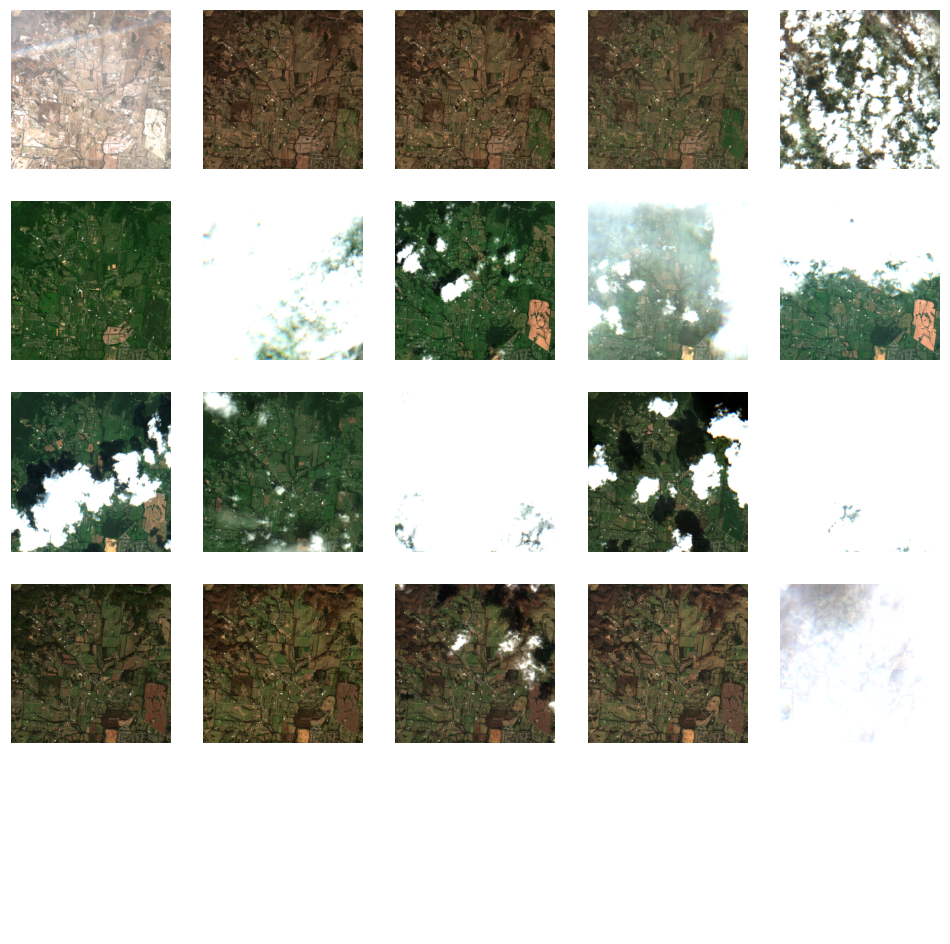

In [39]:
images_this, _, _, _ = ds[363]
images_this = images_this.detach().cpu().numpy()
display_all_images(images_this)

## Query 2 ##

In [40]:
text_query = "There are many buildings in the scene."
text_query_embedding = embed_model.encode([[instruction, text_query]])
text_query_embedding /= np.linalg.norm(text_query_embedding, keepdims=True)
print(top_k_query_cosine(text_query_embedding, embeddings_text_numpy, 2))

[47 67]


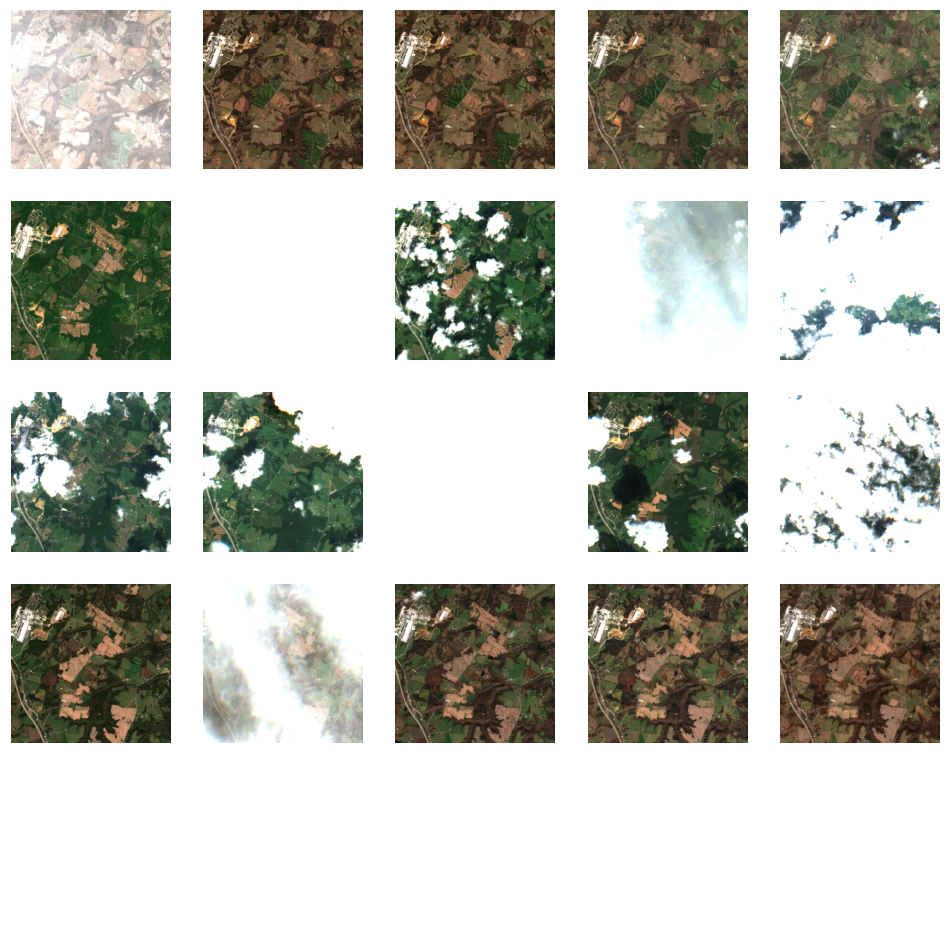

In [41]:
images_this, _, _, _ = ds[47]
images_this = images_this.detach().cpu().numpy()
display_all_images(images_this)

## Query 3

In [42]:
text_query = "There are zero buildings in the scene. There is water area that occupies 0% of the visible area."
text_query_embedding = embed_model.encode([[instruction, text_query]])
text_query_embedding /= np.linalg.norm(text_query_embedding, keepdims=True)
print(top_k_query_cosine(text_query_embedding, embeddings_text_numpy, 5))

[ 5 43  6 44 27]


In [43]:
text_query = "There are zero buildings in the scene. There is water area that occupies 100% of the visible area."
text_query_embedding = embed_model.encode([[instruction, text_query]])
text_query_embedding /= np.linalg.norm(text_query_embedding, keepdims=True)
print(top_k_query_cosine(text_query_embedding, embeddings_text_numpy, 5))

[270  39 103  80 124]


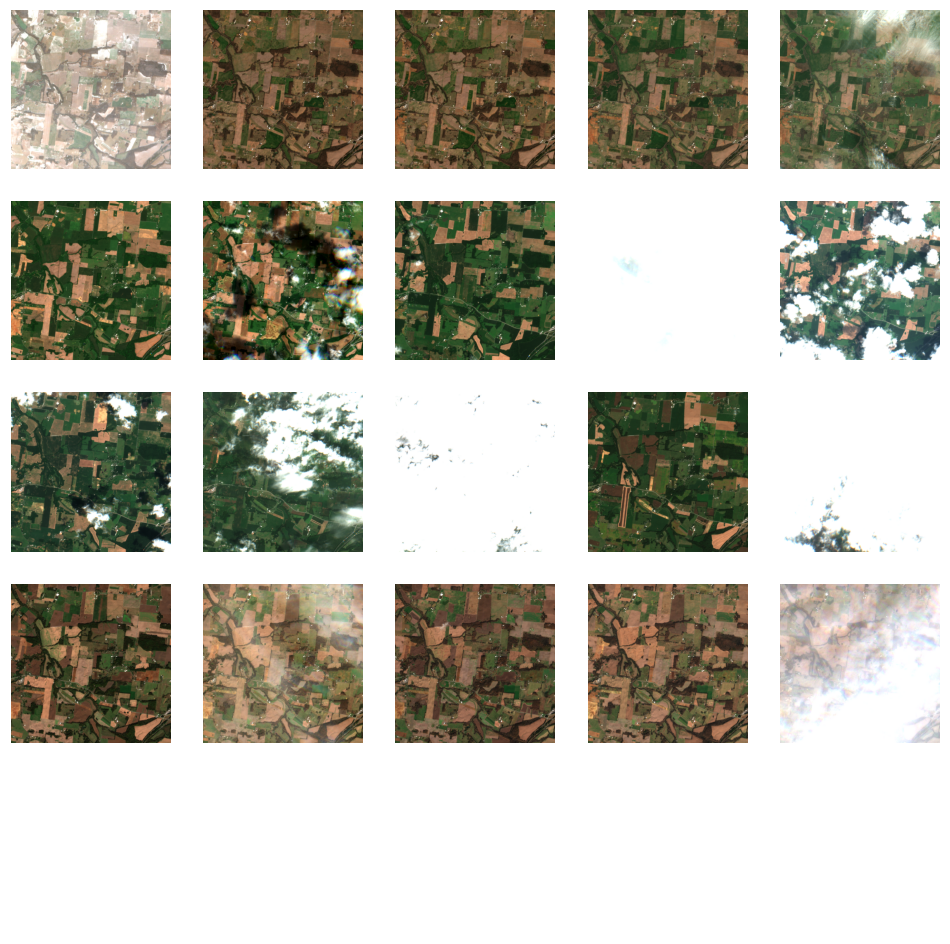

In [44]:
images_this, _, _, _ = ds[270]
images_this = images_this.detach().cpu().numpy()
display_all_images(images_this)

## Sensitivity to phrasing #

In [45]:
text_query = "There are zero buildings in the scene. There is water area that occupies 50% of the visible area."
text_query_embedding = embed_model.encode([[instruction, text_query]])
text_query_embedding /= np.linalg.norm(text_query_embedding, keepdims=True)
phrasing1 = top_k_query_cosine(text_query_embedding, embeddings_text_numpy, 10)
print(phrasing1)

[270 103 142  60 143  39  80 121   1 124]


In [46]:
text_query = "There are zero buildings visible. There is water area that occupies 50% of the visible area."
text_query_embedding = embed_model.encode([[instruction, text_query]])
text_query_embedding /= np.linalg.norm(text_query_embedding, keepdims=True)
phrasing2 = top_k_query_cosine(text_query_embedding, embeddings_text_numpy, 10)
print(phrasing2)

[ 62 100  18  61 101  79 143  39   0 141]


In [47]:
print(set(phrasing1) & set(phrasing2))

{143, 39}


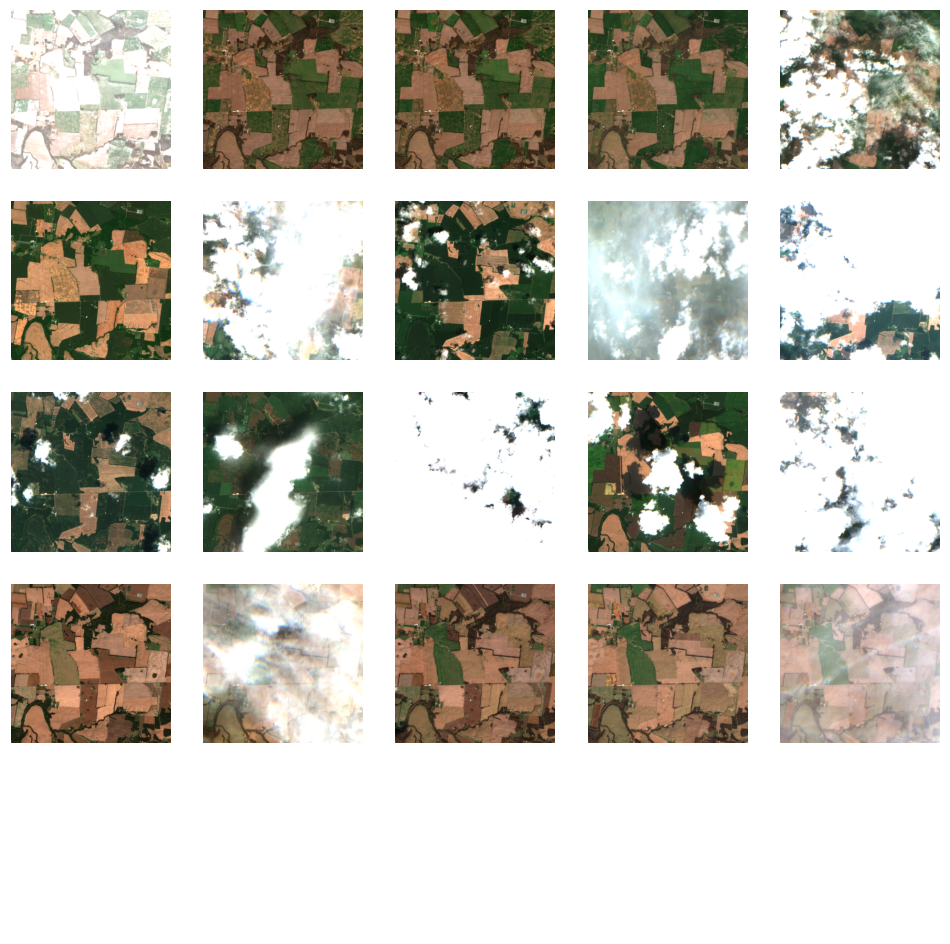

In [48]:
images_this, _, _, _ = ds[143]
images_this = images_this.detach().cpu().numpy()
display_all_images(images_this)

## "Classifier" ##

### Buildings ###

In [49]:
plural_nouns = ["a handful of", "a few", "many", "numerous", "a plethora"]
number_of_buildings = []
for plural_noun in plural_nouns:
    phrase = f"There are {plural_noun} buildings in the scene"
    phrase_embedding = embed_model.encode([[instruction, phrase]])
    number_of_buildings.append(phrase_embedding)
number_of_buildings = np.concatenate(number_of_buildings, axis=0)
number_of_buildings /= np.linalg.norm(number_of_buildings, keepdims=True, axis=1)

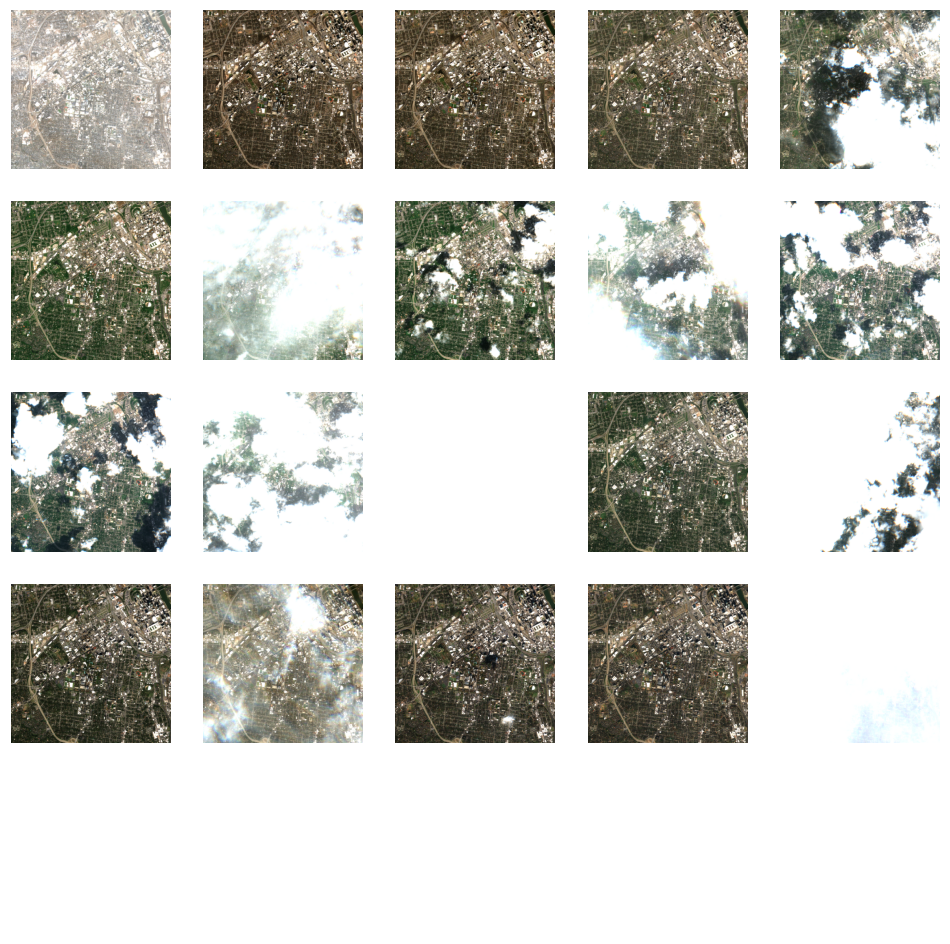

In [50]:
images_this, _, _, _ = ds[38 + 3*42]
images_this = images_this.detach().cpu().numpy()
display_all_images(images_this)

In [51]:
np.dot(number_of_buildings, embeddings_text_numpy[19 + 3*21])

array([0.7349396 , 0.7756933 , 0.7747966 , 0.76403785, 0.6518563 ],
      dtype=float32)

In [52]:
np.dot(number_of_buildings, embeddings_text_numpy[0])

array([0.71579766, 0.7537674 , 0.7525588 , 0.74416006, 0.6448973 ],
      dtype=float32)

### Land use ###

In [53]:
lulcs = ["wood", "water", "farmland", "residential", "industrial"]
land_uses = []
for lulc in lulcs:
    phrase = f"There is {lulc} area that occupies 25% of the visible area."
    phrase_embedding = embed_model.encode([[instruction, phrase]])
    land_uses.append(phrase_embedding)
land_uses = np.concatenate(land_uses, axis=0)
land_uses /= np.linalg.norm(land_uses, keepdims=True, axis=1)

In [54]:
np.dot(land_uses, embeddings_text_numpy[0])

array([0.73667806, 0.69967556, 0.70247984, 0.7491528 , 0.72983545],
      dtype=float32)

In [55]:
np.dot(land_uses, embeddings_text_numpy[-1])

array([0.7054323, 0.6676283, 0.673502 , 0.7180879, 0.7025074],
      dtype=float32)

In [56]:
np.dot(land_uses, embeddings_text_numpy[19 + 3*21])

array([0.70539594, 0.6655847 , 0.6715678 , 0.7176727 , 0.70336163],
      dtype=float32)